### Imports

In [1]:
import os
from PIL import Image
import json
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

import torch
from torch import nn
from torch import utils
from torch.utils.data import DataLoader, Dataset
from torch import optim

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision import transforms

from torchmetrics.detection.mean_ap import MeanAveragePrecision

print(torchvision.__version__)
device = torch.device('cuda:0')

0.12.0


## Dataset
Определяем датасет для использования его при обучении

In [2]:
class PassportDataset(Dataset):
    """ Custom dataset for data representation """
    def __init__(self, data_folder: str):
        self.data_folder = data_folder
        self.json_file_list = [file_name for file_name in os.listdir(data_folder) if '.json' in file_name]
        self.labels_list = [_, 'Surname', 'Name', 'Second Name']
        
    def __getitem__(self, ind: int):
        json_image_path = os.path.normpath(self.data_folder + f'/{self.json_file_list[ind]}')
        json_obj = json.load(open(json_image_path))
        
        # Load image
        img = Image.open(os.path.normpath(self.data_folder + f'/{json_obj["imagePath"]}')).convert("RGB")
        
        # Collect boxes and labels in lists
        boxes = list()
        labels = list()
        
        for item in json_obj['shapes']:
            # Append x_min, y_min, x_max, y_max
            boxes.append(item['points'][0] + item['points'][1])
            # Append box label
            labels.append(self.labels_list.index(item['label']))

        target_dict = {}
        
        boxes_tensor = torch.as_tensor(boxes, dtype=torch.float32)
        
        # Form target dictionary
        target_dict['boxes'] = boxes_tensor
        target_dict['labels'] = torch.as_tensor(labels, dtype=torch.int64)
        target_dict['image_id'] = torch.tensor(ind)
        target_dict['area'] = (boxes_tensor[:, 3] - boxes_tensor[:, 1]) * (boxes_tensor[:, 2] - boxes_tensor[:, 0])
        target_dict['iscrowd'] = torch.zeros((boxes_tensor.shape[0],), dtype=torch.int64)
        
        return img, target_dict
    
    def __len__(self):
        return len(self.json_file_list)

In [3]:
train_ds = PassportDataset('../input/ruspassportdataset/train/')
test_ds = PassportDataset('../input/ruspassportdataset/test/')

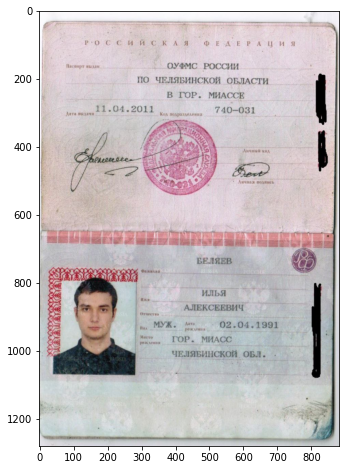

In [4]:
plt.figure(figsize=(12, 8))
plt.imshow(train_ds[1][0])

## Fix randomness

In [5]:
RANDOM_SEED = 123
loader_gen = torch.Generator()

def seed_worker(worker_id):
        worker_seed = torch.initial_seed() % 2 ** 32
        np.random.seed(worker_seed)
        random.seed(worker_seed)

        
def config_randomness():
    global loader_gen
    # Fix seeds
    torch.manual_seed(RANDOM_SEED)
    np.random.seed(RANDOM_SEED)
    random.seed(RANDOM_SEED)
    
    # Fix data loader random seed
    loader_gen = torch.Generator()
    loader_gen.manual_seed(RANDOM_SEED)
    
    # Fix CUDA operations randomness
    torch.cuda.manual_seed_all(RANDOM_SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

## Model definition
Определяем модель **Faster RCNN**, у которой заменяем последние полносвязные слои и обучаем для нашей задачи

In [6]:
def init_linear_layers(m):
    """ Initialize linear layers with Xavier method """
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.0)
        #print(m.weight)


def get_model(train_ds: PassportDataset):
    """ Returns new instance for the model """ 
    config_randomness()
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn()

    num_classes = len(train_ds.labels_list)
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    model.roi_heads.box_predictor.apply(init_linear_layers)
    
    return model

In [7]:
# Utils functions
def collate_fn(batch):
    return tuple(zip(*batch))

In [8]:
model = get_model(train_ds)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

### Testing model initialization 

In [9]:
%%time
# Test values
data_loader = torch.utils.data.DataLoader(train_ds, batch_size=2, shuffle=True, collate_fn=collate_fn)

convert_image = transforms.ToTensor()

# For Training
images, targets = next(iter(data_loader))
images = list((convert_image(image) for image in images))
targets = [{k: v for k, v in t.items()} for t in targets]

model.train()
output = model(images, targets)   # Returns losses and detections

# For inference
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)           # Returns predictions

CPU times: user 21.7 s, sys: 9.62 s, total: 31.3 s
Wall time: 31.7 s


In [10]:
model = get_model(train_ds)

In [11]:
%%time
# Test values
data_loader = torch.utils.data.DataLoader(train_ds, batch_size=4, num_workers=2, shuffle=True, collate_fn=collate_fn)

convert_image = transforms.ToTensor()

# For Training
images, targets = next(iter(data_loader))
images = list((convert_image(image).to(device) for image in images))
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

model.to(device)

model.train()

output = model(images, targets)   # Returns losses and detections

# For inference
model.eval()
x = [torch.rand(3, 300, 400).to(device), torch.rand(3, 500, 400).to(device)]
predictions = model(x)           # Returns predictions


del model
torch.cuda.empty_cache()

CPU times: user 2.67 s, sys: 1.86 s, total: 4.53 s
Wall time: 11 s


## Model training

Определяем алгоритм для тренировки модели, предусмотрев модификацию алгоритма с помощью изменяющегося learning rate, который контролируется с помощью объекта scheduler

In [12]:
def train(model: nn.Module, train_loader: DataLoader, test_loader: DataLoader, optimizer: optim.Optimizer, epoch_num: int, scheduler):
    classifier_loss_history = list()
    regression_loss_history = list()
    
    # Plot configuration
    fig, axes = plt.subplots(1, 2, figsize=(20, 12))
    
    axes[0].set_xlabel('Epoch')
    axes[1].set_xlabel('Epoch')
    
    axes[0].set_ylabel('Loss')
    axes[1].set_ylabel('Loss')
    
    axes[0].grid()
    axes[1].grid()
    
    axes[0].set_title('Classifier loss')
    axes[1].set_title('Box regression loss')
    
    model.to(device)
    
    convert_image = transforms.ToTensor()
    
    for epoch_step in range(epoch_num):
        model.train()
        
        res_loss_dict = {
            'loss_classifier': torch.tensor(0, dtype=torch.float, requires_grad=False), 
            'loss_box_reg': torch.tensor(0, dtype=torch.float, requires_grad=False), 
            'loss_objectness': torch.tensor(0, dtype=torch.float, requires_grad=False), 
            'loss_rpn_box_reg': torch.tensor(0, dtype=torch.float, requires_grad=False),
        }
        # Train epoch
        for step, (imgs, targets) in enumerate(train_loader, 1):
            images = list((convert_image(image).to(device) for image in imgs))
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            loss_dict = model(images, targets)
            
            losses = sum(loss for loss in loss_dict.values())
            
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()
            
            # Collect loss 
            for key in loss_dict:
                res_loss_dict[key] += loss_dict[key].to(torch.device('cpu')).detach() / len(train_loader)
            
            torch.cuda.empty_cache()
        if scheduler:
            scheduler.step()
        
        classifier_loss_history.append(res_loss_dict['loss_classifier'])
        regression_loss_history.append(res_loss_dict['loss_box_reg'])
        
        # Validate model
        model.eval()
        
        for img_batch, target_batch in test_loader:
            prep_img_batch = list((convert_image(img).to(device) for img in img_batch))        
        
            outputs = model(prep_img_batch)
            
            batch_model_answer = list()
            
            # Process model predictions
            for temp_image, mod_answer in zip(img_batch, outputs):
                kept_ind = torchvision.ops.nms(mod_answer['boxes'], mod_answer['scores'], 0.4)            

                mod_answer['boxes'] = mod_answer['boxes'][kept_ind]
                mod_answer['labels'] = mod_answer['labels'][kept_ind]
                mod_answer['scores'] = mod_answer['scores'][kept_ind]
                
                batch_model_answer.append(mod_answer)
            
            # Collect results for calculating mAP score
            target_batch = [{k: v.to(device) for k, v in t.items()} for t in target_batch]
            map_metric.update(preds=batch_model_answer, target=target_batch)
            # Free GPU space
            torch.cuda.empty_cache()
        
        map_metric_result = map_metric.compute()
        map_metric.reset()
    
        print(f'-------------- Classifier loss: {res_loss_dict["loss_classifier"]} Box reg loss: {res_loss_dict["loss_box_reg"]} MAP: {map_metric_result["map"]} --------------')
    
    axes[0].plot(list(range(1, epoch_num + 1)), classifier_loss_history)
    axes[1].plot(list(range(1, epoch_num + 1)), regression_loss_history)
    
    return classifier_loss_history, regression_loss_history

In [13]:
torch.cuda.empty_cache()

model = get_model(train_ds)

# Training parameters
lr = 0.01
epoch_num = 30

map_metric = MeanAveragePrecision(box_format="xyxy")


train_loader = DataLoader(train_ds, batch_size=2, num_workers=2, shuffle=True, collate_fn=collate_fn, worker_init_fn=seed_worker, generator=loader_gen)
test_loader = DataLoader(test_ds, batch_size=2, num_workers=2, shuffle=False, collate_fn=collate_fn)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.SGD(params, lr=lr, weight_decay=0.0005)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.78)

torch.cuda.empty_cache()

-------------- Classifier loss: 0.15623661875724792 Box reg loss: 0.05166411027312279 MAP: 0.02792108803987503 --------------
-------------- Classifier loss: 0.11373652517795563 Box reg loss: 0.07601544260978699 MAP: 0.025641730055212975 --------------
-------------- Classifier loss: 0.11369983106851578 Box reg loss: 0.09863264113664627 MAP: 0.12115996330976486 --------------
-------------- Classifier loss: 0.1050548255443573 Box reg loss: 0.09843394160270691 MAP: 0.07391330599784851 --------------
-------------- Classifier loss: 0.0941709652543068 Box reg loss: 0.11060254275798798 MAP: 0.15355630218982697 --------------
-------------- Classifier loss: 0.09260998666286469 Box reg loss: 0.11447866261005402 MAP: 0.16133415699005127 --------------
-------------- Classifier loss: 0.07790982723236084 Box reg loss: 0.10347947478294373 MAP: 0.17609621584415436 --------------
-------------- Classifier loss: 0.07262998074293137 Box reg loss: 0.10727953910827637 MAP: 0.2908293902873993 ---------

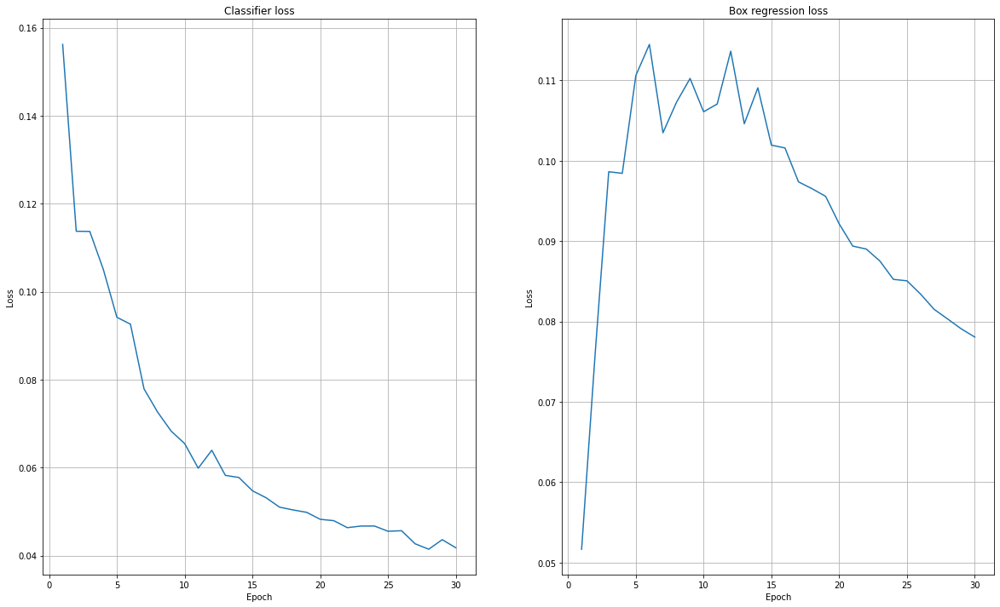

In [14]:
%%time
res = train(model, train_loader, test_loader, optimizer, epoch_num, scheduler)

### Сохраняем модель

In [15]:
import pickle
import datetime

with open('trained_model_' + datetime.datetime.now().strftime('%M_%d_%s'), mode='wb') as file:
    pickle.dump(model, file)

## Демонстрация результатов

In [16]:
def show_model_prediction(model: nn.Module, dataset: PassportDataset):
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, num_workers=2, shuffle=False, collate_fn=collate_fn)
    
    img_count = len(dataset)
    
    fig, axes = plt.subplots(img_count, 2, gridspec_kw={'width_ratios': [4, 1]}, figsize=(24, img_count * 20))
    
    model.eval()
    
    img_convert = transforms.ToTensor()
    
    plt_ind = 0
    
    for img_batch, target_batch in data_loader:        
        prep_img_batch = list((img_convert(img).to(device) for img in img_batch))        
        
        outputs = model(prep_img_batch)

        
        for temp_image, mod_answer in zip(img_batch, outputs):
            # Apply non maximum supression
            kept_ind = torchvision.ops.nms(mod_answer['boxes'], mod_answer['scores'], 0.4)            
            
            mod_answer['boxes'] = mod_answer['boxes'][kept_ind]
            mod_answer['labels'] = mod_answer['labels'][kept_ind]
            mod_answer['scores'] = mod_answer['scores'][kept_ind]
            
            conf_ans_ind = mod_answer['scores'] >= 0.65
            
            mod_answer['boxes'] = mod_answer['boxes'][conf_ans_ind]
            mod_answer['labels'] = mod_answer['labels'][conf_ans_ind]
            mod_answer['scores'] = mod_answer['scores'][conf_ans_ind]
            

            temp_image = np.array(temp_image)
            # Convert RGB to BGR 
            temp_image = temp_image[:, :, ::-1].copy() 

            for box_ind, (box, label) in enumerate(zip(mod_answer['boxes'], mod_answer['labels']), 1):
                # unpack the bounding box
                x0 = int(box[0])
                y0 = int(box[1])
                x1 = int(box[2])
                y1 = int(box[3])
                
                # Add boxes to the image
                cv2.rectangle(temp_image, (x0, y0), (x1, y1), (0, 0, 255), 1)
                cv2.putText(temp_image, str(box_ind), ((x0 + x1) // 2, (y0 + y1) // 2), 
                            cv2.FONT_HERSHEY_COMPLEX, 0.6, (0, 255, 0))

                axes[plt_ind, 1].text(0, 1 - box_ind / len(mod_answer['boxes']), 
                                      f'{box_ind} -> {dataset.labels_list[label]}', fontsize=15, transform=axes[plt_ind, 1].transAxes)

            
            # Plot image with boxes
            img_obj = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)

            img_width, img_height, _ = img_obj.shape

            cv2.resize(img_obj, (int(3 * img_width), int(3 * img_height)))

            axes[plt_ind, 0].imshow(img_obj)
            axes[plt_ind, 1].axis('off')
            plt_ind += 1
        
    plt.show()

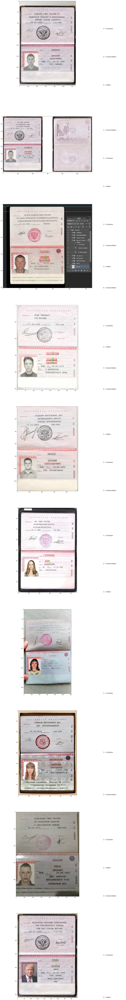

CPU times: user 7.99 s, sys: 650 ms, total: 8.64 s
Wall time: 8.66 s


In [17]:
%%time
show_model_prediction(model.to(device), test_ds)

## Генерируем примеры для тренировки модели распознавания

In [ ]:
def save_boxes_result(dataset: PassportDataset, folder_name: str):
    ind = 0
    
    data_loader = torch.utils.data.DataLoader(dataset, batch_size=2, num_workers=2, shuffle=False, collate_fn=collate_fn)
    
    model.eval()
    img_convert = transforms.ToTensor()
    
    for img_batch, target_batch in data_loader:
        torch.cuda.empty_cache()
        prep_img_batch = list((img_convert(img).to(device) for img in img_batch))
        outputs = model(prep_img_batch)
        
        for temp_image, mod_answer in zip(img_batch, outputs):

            kept_ind = torchvision.ops.nms(mod_answer['boxes'], mod_answer['scores'], 0.2)            
            
            mod_answer['boxes'] = mod_answer['boxes'][kept_ind]
            mod_answer['labels'] = mod_answer['labels'][kept_ind]
            mod_answer['scores'] = mod_answer['scores'][kept_ind]
            
            conf_ans_ind = mod_answer['scores'] >= 0.65
            
            mod_answer['boxes'] = mod_answer['boxes'][conf_ans_ind]
            mod_answer['labels'] = mod_answer['labels'][conf_ans_ind]
            mod_answer['scores'] = mod_answer['scores'][conf_ans_ind]
            

            temp_image = np.array(temp_image)
            # Convert RGB to BGR 
            temp_image = temp_image[:, :, ::-1].copy() 

            for box_ind, (box, label) in enumerate(zip(mod_answer['boxes'], mod_answer['labels']), 1):
                # unpack the bounding box
                x0 = int(box[0])
                y0 = int(box[1])
                x1 = int(box[2])
                y1 = int(box[3])
                
                cropped_image = temp_image[y0:y1, x0:x1]
                
                cv2.imwrite(os.path.normpath(folder_name + f'img_{ind}.png'), cropped_image)
                
                ind += 1

In [ ]:
%%time
save_boxes_result(train_ds, '')

Сохраняем результаты в zip архив для обучения модели распознавания

In [ ]:
# !mkdir img_folder
# !mv $(ls | grep img) img_folder 
# import shutil
# shutil.make_archive('zipped_images', 'zip', 'img_folder')